<a href="https://colab.research.google.com/github/DVN111/Data-Analyst-Portfolio/blob/main/Supermarket_Sales_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# eCommerce Data Analysis

**# Problem Statement**

Explorasi insight dalam data, jika memungkinkan, itu akan melahirkan perediksi

**# Tujuan**

Mengeksplorasi insights yang ada pada data, jika memungkinkan untuk membuat model prediksi

**# Data yang diperlukan**
Konteks
Pertumbuhan supermarket di kota-kota dengan populasi besar semakin meningkat, dan persaingan pasar juga sangat ketat. Dataset ini adalah salah satu dari penjualan historis perusahaan supermarket yang dicatat di 3 cabang berbeda selama 3 bulan. Metode analisis data prediktif mudah diterapkan dengan dataset ini.

Informasi Atribut

- ID faktur: Nomor identifikasi faktur penjualan yang dihasilkan oleh komputer
- Cabang: Cabang dari supermarket (tersedia 3 cabang yang diidentifikasi dengan A, B, dan C)
- Kota: Lokasi supermarket
- Tipe pelanggan: Jenis pelanggan, dicatat sebagai Member untuk pelanggan yang menggunakan kartu anggota dan Normal untuk pelanggan tanpa kartu anggota
- Jenis kelamin: Jenis kelamin pelanggan
- Lini produk: Kelompok pengelompokan barang umum - Aksesoris elektronik, Aksesoris fesyen, Makanan dan minuman, Kesehatan dan kecantikan, Rumah dan gaya hidup, Olahraga dan perjalanan
- Harga satuan: Harga setiap produk dalam dolar ($)
- Kuantitas: Jumlah produk yang dibeli oleh pelanggan
- Pajak: Biaya pajak 5% untuk pembelian pelanggan
- Total: Harga total termasuk pajak
- Tanggal: Tanggal pembelian (Data tersedia dari Januari 2019 hingga Maret 2019)
- Waktu: Waktu pembelian (dari jam 10 pagi hingga 9 malam)
- Pembayaran: Metode pembayaran yang digunakan pelanggan untuk pembelian (tersedia 3 metode – Tunai, Kartu kredit, dan Dompet elektronik)
- COGS: Harga pokok penjualan
- Persentase margin kotor: Persentase margin kotor
- Pendapatan kotor: Pendapatan kotor
- Penilaian: Penilaian stratifikasi pelanggan berdasarkan pengalaman belanja mereka secara keseluruhan (dengan skala 1 sampai 10)
Pengakuan

Tujuan
Dataset ini dapat digunakan untuk tujuan analisis data prediktif.




## Set Up Environment

In [1]:
import os
import shutil

import warnings
warnings.filterwarnings('ignore')


## 1. Collecting Dataset
dataset ini bersumber dari
- https://www.kaggle.com/datasets/aungpyaeap/supermarket-sales/data

<br>Yang sudah saya lakukan cleaning data menggunakan excel, dan python

## 2. Understanding & Cleaning Dataset


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('/content/exported_dataset.csv')
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Year
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,5,1,2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,8,3,2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,3,3,2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,27,1,2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,8,2,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46,Ewallet,40.35,4.761905,2.0175,6.2,29,1,2019
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16,Ewallet,973.80,4.761905,48.6900,4.4,2,3,2019
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22,Cash,31.84,4.761905,1.5920,7.7,9,2,2019
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33,Cash,65.82,4.761905,3.2910,4.1,22,2,2019


analisis:
- supermarket ini memiliki 3 cabang yang ada di setiap kota. jadi A B C sama saja dengan mandalay yangon dll.

In [4]:
types = df.dtypes
missing_values = df.isnull().sum()
duplicated_rows = df.duplicated().sum()
unique_values = df.nunique()

data_summary = pd.DataFrame({
    "Data Types": types,
    "Missing values": missing_values,
    "Duplicated values": duplicated_rows,
    "Unique values": unique_values
})

data_summary['Categorical'] = (unique_values <= 24) # conditon, true and false
cat_var = []
for cat in data_summary[data_summary['Categorical']== True].index.tolist():
  cat_var.append(cat)
print(f'Kolom kategorikal: {cat_var}\n')
data_summary

Kolom kategorikal: ['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Quantity', 'Payment', 'gross margin percentage', 'Month', 'Year']



,Data Types,Missing values,Duplicated values,Unique values,Categorical
Invoice ID,object,0,0,1000,False
Branch,object,0,0,3,True
City,object,0,0,3,True
Customer type,object,0,0,2,True
Gender,object,0,0,2,True
Product line,object,0,0,6,True
Unit price,float64,0,0,943,False
Quantity,int64,0,0,10,True
Tax 5%,float64,0,0,990,False
Total,float64,0,0,990,False


insights:
- dalam data ini memiliki lumayan banyak kolom kategorikal seperti 'Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Quantity', 'Payment', 'gross margin percentage', 'Month', 'Year'

In [5]:
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Day,Month,Year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.0
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270,15.256000,1.993000,2019.0
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858,8.693563,0.835254,0.0
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000,1.000000,1.000000,2019.0
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000,8.000000,1.000000,2019.0
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000,15.000000,2.000000,2019.0
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000,23.000000,3.000000,2019.0
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000,31.000000,3.000000,2019.0


insights:
- kolom total memiliki outlier


In [6]:
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Year
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,5,1,2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,8,3,2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,3,3,2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,27,1,2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,8,2,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46,Ewallet,40.35,4.761905,2.0175,6.2,29,1,2019
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16,Ewallet,973.80,4.761905,48.6900,4.4,2,3,2019
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22,Cash,31.84,4.761905,1.5920,7.7,9,2,2019
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33,Cash,65.82,4.761905,3.2910,4.1,22,2,2019


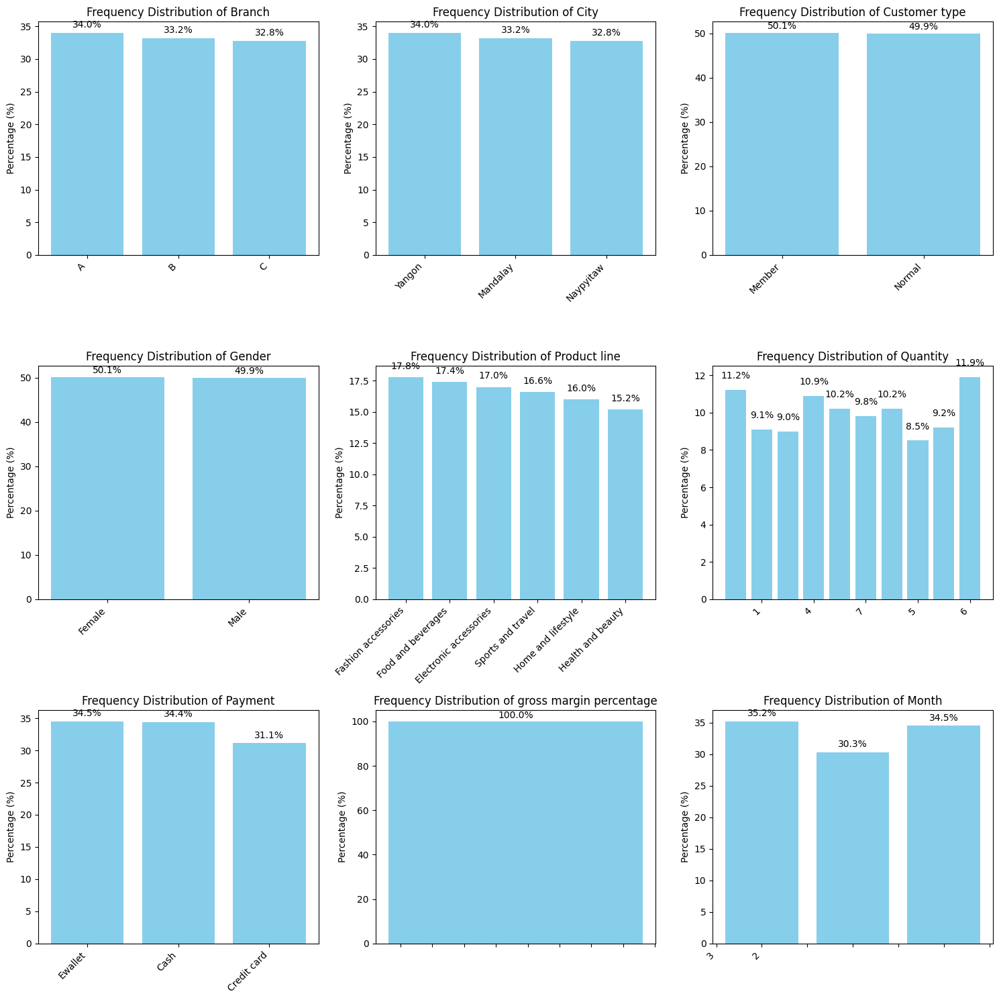

Frequency Distribution of Branch:
Branch
A    34.0
B    33.2
C    32.8
Name: proportion, dtype: float64


Frequency Distribution of City:
City
Yangon       34.0
Mandalay     33.2
Naypyitaw    32.8
Name: proportion, dtype: float64


Frequency Distribution of Customer type:
Customer type
Member    50.1
Normal    49.9
Name: proportion, dtype: float64


Frequency Distribution of Gender:
Gender
Female    50.1
Male      49.9
Name: proportion, dtype: float64


Frequency Distribution of Product line:
Product line
Fashion accessories       17.8
Food and beverages        17.4
Electronic accessories    17.0
Sports and travel         16.6
Home and lifestyle        16.0
Health and beauty         15.2
Name: proportion, dtype: float64


Frequency Distribution of Quantity:
Quantity
10    11.9
1     11.2
4     10.9
7     10.2
5     10.2
6      9.8
9      9.2
2      9.1
3      9.0
8      8.5
Name: proportion, dtype: float64


Frequency Distribution of Payment:
Payment
Ewallet        34.5
Cash           

In [7]:
import matplotlib.pyplot as plt

# Create a 3x3 subplot grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through categorical columns and create bar plots
for i, column in enumerate(cat_var):
    if i < len(axes):
        value_counts = df[column].value_counts(normalize=True) * 100
        value_counts = value_counts.sort_values(ascending=False)
        ax = axes[i]
        bars = ax.bar(value_counts.index, value_counts.values, color='skyblue')
        ax.set_title(f'Frequency Distribution of {column}')
        ax.set_ylabel('Percentage (%)')
        ax.set_xticklabels(value_counts.index, rotation=45, ha='right')

        # Add text labels on bars
        for bar in bars:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2.0,
                height + 0.5,
                f'{height:.1f}%',
                ha='center',
                va='bottom'
            )

# Remove any unused subplots
for i in range(len(cat_var), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# Print the frequency distribution for each column
for column in cat_var:
    print(f"Frequency Distribution of {column}:")
    print(df[column].value_counts(normalize=True) * 100)
    print("\n")


analysis frekuensi tiap fitur kategorikal
---------------------------------------------
branch/cabang:
- dari ketiga cabang supermarket yang ada di setiap kota, cabang A adalah cabang dengan jumlah transaksi terbanyak dengan 34% dari total transaksi pada supermarket. Sedang kedua cabang lainnya 34,2% dan 32,8%.

City/kota:
- kota yang memiliki jumlah transaksi terbanyak ialah kota yangon yang jumlah transaksinya mencapai 34.0%, disusuldengan mandalay 33,2% dan Naypyitaw 32.8%

tipe customer:
- dari keseluruhan transaksi, baik member maupun yang non member memiliki jumlah yang nyaris setara.

gender:
- baik customer yang bergender male ataupun female memiliki persentase yang sama.

product line:
- lini produk / kategori produk yang paling banyak ditransaksikan ialah dashion accessories dengan 17,8%, food and becerages 17,4%, electronic accessories 17.0% dll.

kuantitas:
- customer membeli barang paling sedikit 1 pcs, paling banyak 10pc.
ada 11,9% transaksi dimana customer membeli 10pcs produk

payment:
- dalam payment, customer lebih suka menggunakna ewallet dan cash disbanding credit card

month / bulan:
- jumlah transaksi terbanyak ialah pada bulan januari / awal tahun dengan 35% dari keseluruhan transaksi. kemudian bulan ketiga dengan 34.5% dan bulan kedua dengan 30.3%

year:
- data ini hanya pada tahun 2019

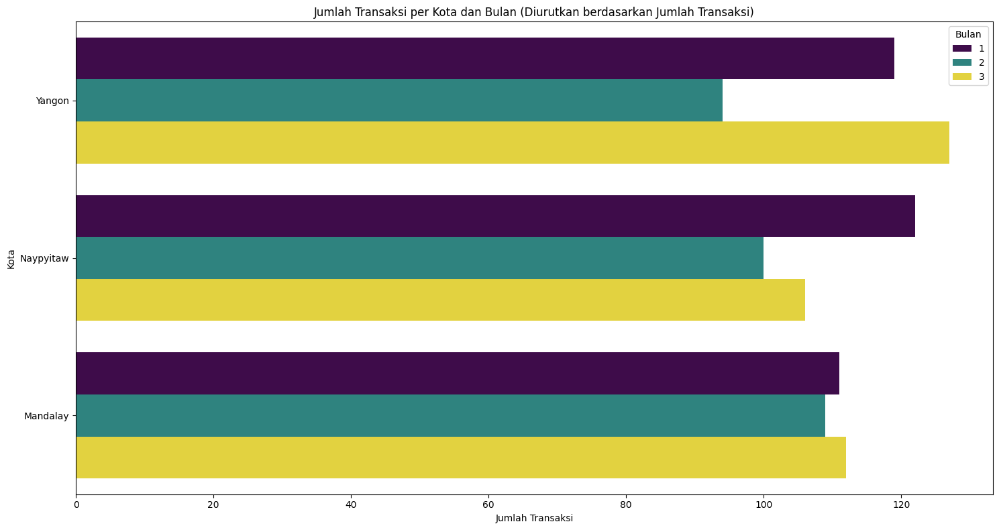

Jumlah Transaksi per Kota dan Bulan:
        City  Month  Transaction Count
8     Yangon      3                127
3  Naypyitaw      1                122
6     Yangon      1                119
2   Mandalay      3                112
0   Mandalay      1                111
1   Mandalay      2                109
5  Naypyitaw      3                106
4  Naypyitaw      2                100
7     Yangon      2                 94

Bulan dengan Jumlah Transaksi Tertinggi di Setiap Kota:
        City  Month  Transaction Count
2   Mandalay      3                112
3  Naypyitaw      1                122
8     Yangon      3                127


In [8]:
# prompt: analisis bulan apa pada tiap kota yang terjadi transaksi

# Group data by city and month, count the number of transactions
city_month_transactions = df.groupby(['City', 'Month'])['Invoice ID'].count().reset_index()

# Rename the 'Invoice ID' column to 'Transaction Count'
city_month_transactions = city_month_transactions.rename(columns={'Invoice ID': 'Transaction Count'})

# Sort by transaction count in descending order
city_month_transactions = city_month_transactions.sort_values('Transaction Count', ascending=False)

# Create a plot
plt.figure(figsize=(15, 8))
sns.barplot(x='Transaction Count', y='City', hue='Month', data=city_month_transactions, palette='viridis')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Kota')
plt.title('Jumlah Transaksi per Kota dan Bulan (Diurutkan berdasarkan Jumlah Transaksi)')
plt.legend(title='Bulan')
plt.tight_layout()
plt.show()

# Print the results
print("Jumlah Transaksi per Kota dan Bulan:")
print(city_month_transactions)

# Find the month with the highest number of transactions for each city
highest_transactions_per_city = city_month_transactions.loc[city_month_transactions.groupby('City')['Transaction Count'].idxmax()]

print("\nBulan dengan Jumlah Transaksi Tertinggi di Setiap Kota:")
print(highest_transactions_per_city)


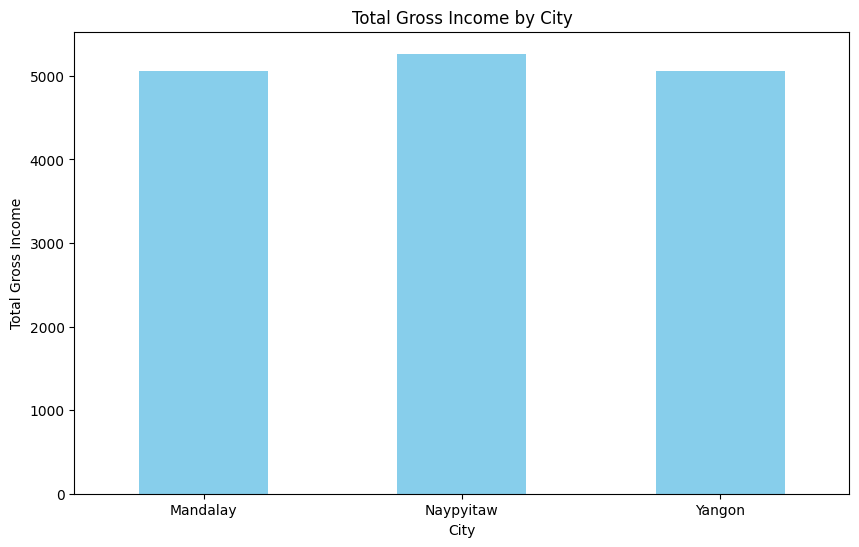

City
Mandalay     5057.0320
Naypyitaw    5265.1765
Yangon       5057.1605
Name: gross income, dtype: float64


In [9]:
# prompt: buat plot kota mana yang paling menguntungkan

# Group data by city and calculate total gross income
city_gross_income = df.groupby('City')['gross income'].sum()

# Create a bar plot
plt.figure(figsize=(10, 6))
city_gross_income.plot(kind='bar', color='skyblue')
plt.title('Total Gross Income by City')
plt.xlabel('City')
plt.ylabel('Total Gross Income')
plt.xticks(rotation=0)
plt.show()

# Print the total gross income for each city
print(city_gross_income)


insights:
- kota yang paling potensial adalah naypyitaw, disusul oleh yangon dan mandalay


In [10]:
# prompt: analisis kota mana yang paling menguntungkan berdasarkan gross income dan tampilkan nilainya dalam persentase

# Group data by city and calculate total gross income
city_gross = df.groupby('City')['gross income'].sum()

# Calculate the percentage of total gross income for each city
total_gross = city_gross.sum()
city_percentage = (city_gross / total_gross) * 100

# Sort cities by gross income in descending order
city_percentage = city_percentage.sort_values(ascending=False)

# Print the results
print("Persentase Gross Income per Kota:")
for city, percentage in city_percentage.items():
  print(f"{city}: {percentage:.2f}%")

# Find the city with the highest gross income
most_profitable_city = city_percentage.idxmax()
highest_percentage = city_percentage.max()

print(f"\nKota yang paling menguntungkan adalah {most_profitable_city} dengan persentase {highest_percentage:.2f}% dari total gross income.")


Persentase Gross Income per Kota:
Naypyitaw: 34.24%
Yangon: 32.88%
Mandalay: 32.88%

Kota yang paling menguntungkan adalah Naypyitaw dengan persentase 34.24% dari total gross income.


In [11]:
# prompt: dari setiap kota, bagaimana performa sales pada setiap kategori. Tampilkan nilainya dalam persentase dan print dengan terurut dari yang paling tinggi

# Group data by city and product line, then calculate total gross income
city_product_gross_income = df.groupby(['City', 'Product line'])['gross income'].sum().unstack()

# Calculate the percentage of gross income for each product line within each city
city_product_gross_income_percentage = city_product_gross_income.div(city_product_gross_income.sum(axis=1), axis=0) * 100

# Sort the product lines by percentage of gross income in descending order for each city
for city in city_product_gross_income_percentage.index:
  print(f"\nCity: {city}")
  sorted_product_lines = city_product_gross_income_percentage.loc[city].sort_values(ascending=False)
  print(sorted_product_lines)



City: Mandalay
Product line
Sports and travel         18.821692
Health and beauty         18.814593
Home and lifestyle        16.524999
Electronic accessories    16.056325
Fashion accessories       15.455439
Food and beverages        14.326951
Name: Mandalay, dtype: float64

City: Naypyitaw
Product line
Food and beverages        21.495101
Fashion accessories       19.499251
Electronic accessories    17.155826
Health and beauty         15.027151
Sports and travel         14.255325
Home and lifestyle        12.567347
Name: Naypyitaw, dtype: float64

City: Yangon
Product line
Home and lifestyle        21.108397
Sports and travel         18.241650
Electronic accessories    17.247693
Food and beverages        16.161055
Fashion accessories       15.378956
Health and beauty         11.862250
Name: Yangon, dtype: float64


        City  Month  gross income  Percentage
3  Naypyitaw      1     1925.4610   12.519766
6     Yangon      1     1841.9585   11.976815
8     Yangon      3     1793.2915   11.660371
5  Naypyitaw      3     1771.3830   11.517917
0   Mandalay      1     1770.2885   11.510801
2   Mandalay      3     1647.4925   10.712354
1   Mandalay      2     1639.2510   10.658766
4  Naypyitaw      2     1568.3325   10.197639
7     Yangon      2     1421.9105    9.245571


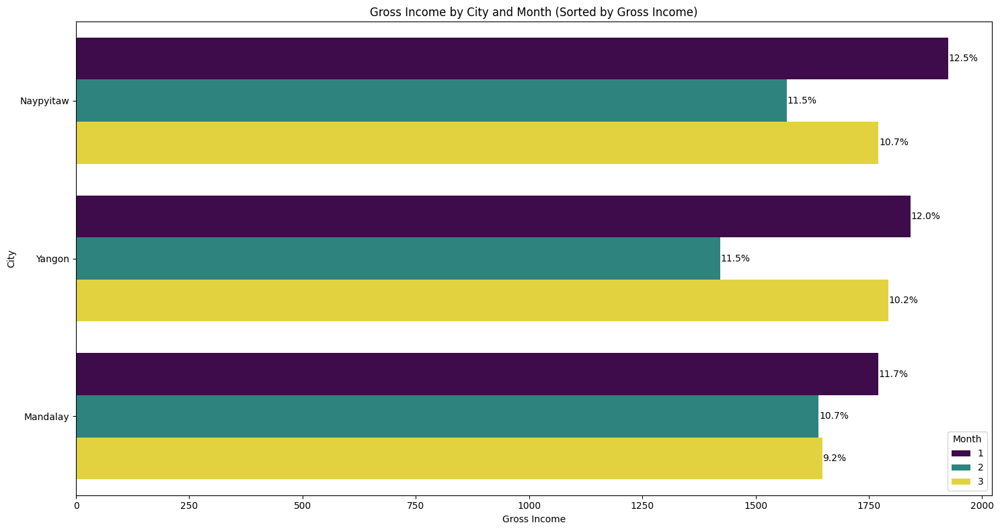

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Group data by city and month, calculate total gross income
city_month_gross = df.groupby(['City', 'Month'])['gross income'].sum().reset_index()

# Sort by gross income in descending order
city_month_gross = city_month_gross.sort_values('gross income', ascending=False)

# Calculate the percentage of total gross income for each city and month
total_gross = city_month_gross['gross income'].sum()
city_month_gross['Percentage'] = (city_month_gross['gross income'] / total_gross) * 100

# Print the sorted data for verification
print(city_month_gross)

# Create a plot
plt.figure(figsize=(15, 8))
bar_plot = sns.barplot(x='gross income', y='City', hue='Month', data=city_month_gross, palette='viridis')
plt.xlabel('Gross Income')
plt.ylabel('City')
plt.title('Gross Income by City and Month (Sorted by Gross Income)')

# Add percentage labels to the bars
for i, p in enumerate(bar_plot.patches):
    # Check if the patch is valid for labeling (hue creates multiple patches per city)
    if p.get_width() > 0:  # only label visible bars
        width = p.get_width()
        plt.text(width + 1, p.get_y() + p.get_height() / 2,
                 f'{city_month_gross["Percentage"].iloc[i % len(city_month_gross)]:.1f}%',
                 ha='left', va='center')

plt.legend(title='Month')
plt.tight_layout()
plt.show()


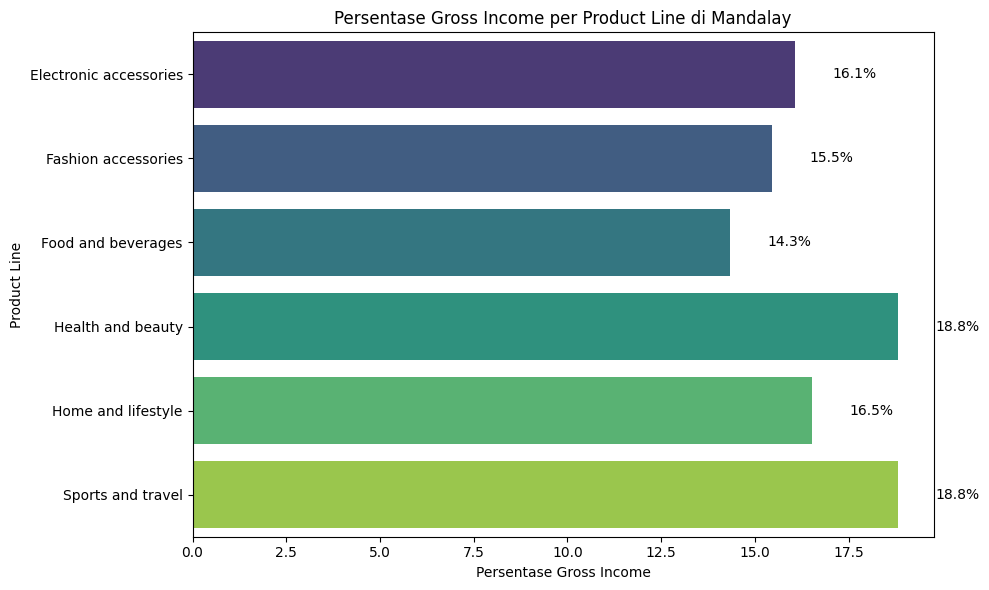

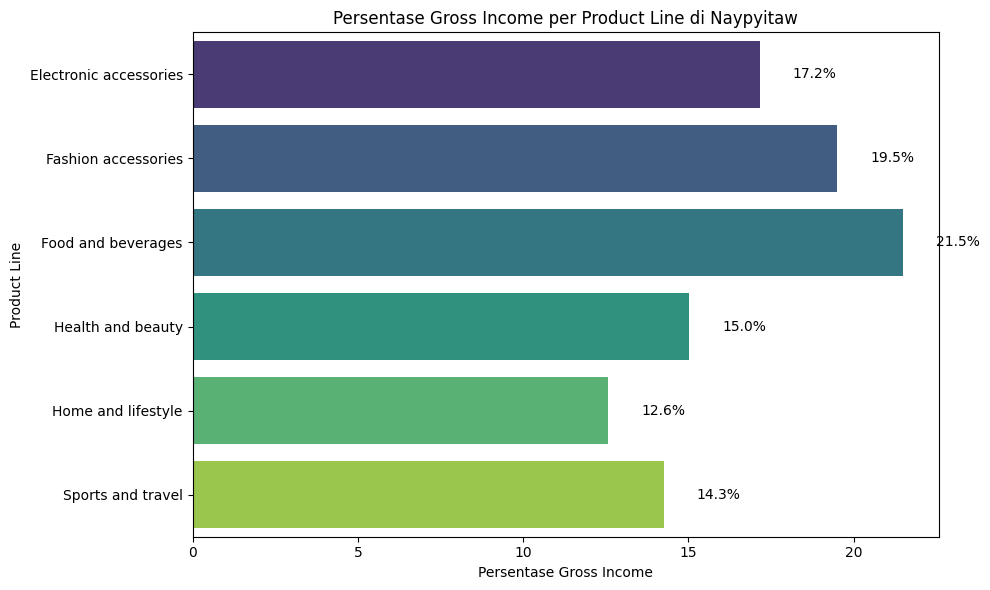

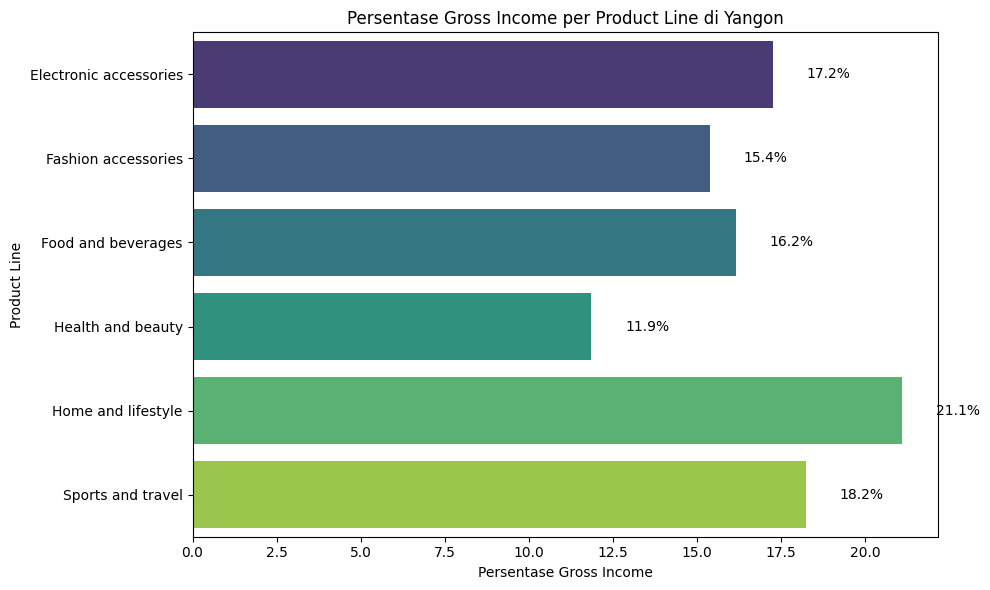

In [13]:
# prompt: analisis pada tiap kota, product line mana yang paling banyak menghasilkan gross income. tampilkan dalam bentuk plot yang nilainya ditampilkan dalam persentase

# Group data by city and product line, calculate total gross income
city_product_gross = df.groupby(['City', 'Product line'])['gross income'].sum().reset_index()

# Calculate the percentage of total gross income for each product line within each city
city_product_gross['Percentage'] = city_product_gross.groupby('City')['gross income'].transform(lambda x: (x / x.sum()) * 100)

# Create a plot for each city
for city in city_product_gross['City'].unique():
  city_data = city_product_gross[city_product_gross['City'] == city]

  plt.figure(figsize=(10, 6))
  plt.title(f'Persentase Gross Income per Product Line di {city}')
  sns.barplot(x='Percentage', y='Product line', data=city_data, palette='viridis')
  plt.xlabel('Persentase Gross Income')
  plt.ylabel('Product Line')

  # Add percentage labels to the bars
  for i, p in enumerate(plt.gca().patches):
    width = p.get_width()
    plt.text(width + 1, p.get_y() + p.get_height() / 2, f'{city_data["Percentage"].iloc[i]:.1f}%', ha='left', va='center')

  plt.tight_layout()
  plt.show()


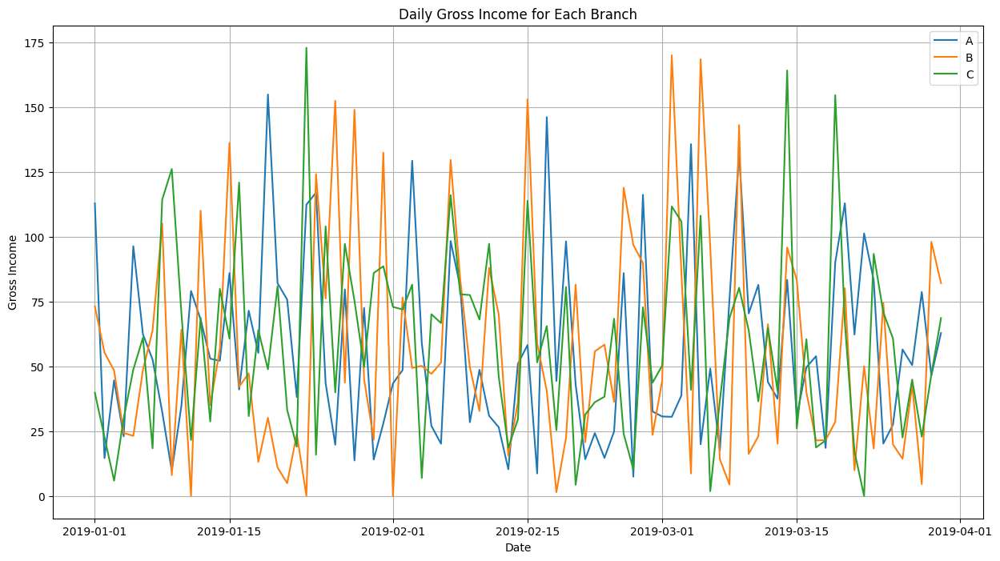

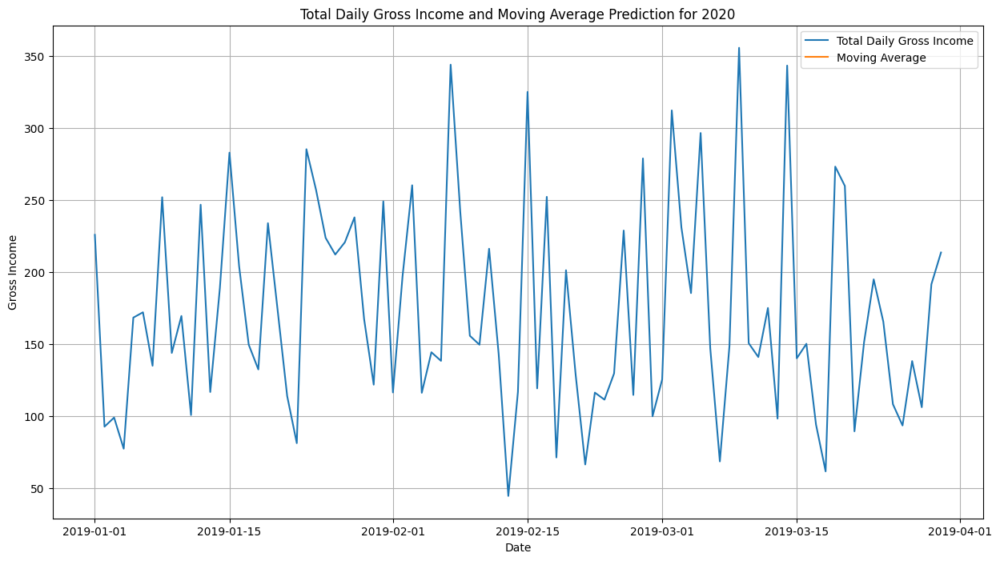

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert 'Date' column to datetime objects
df['Date'] = pd.to_datetime(df['Date'])

# Group data by date and branch, then calculate total gross income
daily_gross_income = df.groupby(['Date', 'Branch'])['gross income'].sum().unstack(fill_value=0)

# Plot daily gross income for each branch
plt.figure(figsize=(15, 8))
for branch in daily_gross_income.columns:
    plt.plot(daily_gross_income.index, daily_gross_income[branch], label=branch)

plt.xlabel('Date')
plt.ylabel('Gross Income')
plt.title('Daily Gross Income for Each Branch')
plt.legend()
plt.grid(True)
plt.show()

# Calculate total gross income for all branches
total_daily_gross_income = df.groupby('Date')['gross income'].sum()

# Calculate the moving average for total gross income
window_size = 7  # You can adjust the window size as needed
moving_average = total_daily_gross_income.rolling(window=window_size).mean()

# Create a DataFrame for prediction
prediction_df = pd.DataFrame({'Date': pd.date_range(start='2020-01-01', end='2020-12-31')})

# Create a new Series with the same index as prediction_df and concatenate
extended_moving_average = pd.concat([
    moving_average,
    pd.Series(index=prediction_df['Date'], dtype='float64')
])

# Reindex to include all dates from prediction_df
extended_moving_average = extended_moving_average.reindex(prediction_df['Date'])

# Interpolate missing values in the extended moving average
extended_moving_average = extended_moving_average.interpolate(method='linear')

# Plot the total daily gross income and the moving average
plt.figure(figsize=(15, 8))
plt.plot(total_daily_gross_income.index, total_daily_gross_income, label='Total Daily Gross Income')
plt.plot(extended_moving_average.index, extended_moving_average, label='Moving Average')
plt.xlabel('Date')
plt.ylabel('Gross Income')
plt.title('Total Daily Gross Income and Moving Average Prediction for 2020')
plt.legend()
plt.grid(True)
plt.show()


Insights:


In [15]:
# prompt: productline mana yang memiliki transaksi terbanyak pada tiap bulan dan untuk tiap kota

# Group data by city, month, and product line, count the number of transactions
city_month_product_transactions = df.groupby(['City', 'Month', 'Product line'])['Invoice ID'].count().reset_index()

# Rename the 'Invoice ID' column to 'Transaction Count'
city_month_product_transactions = city_month_product_transactions.rename(columns={'Invoice ID': 'Transaction Count'})

# Find the product line with the highest number of transactions for each city and month
highest_transactions_per_city_month = city_month_product_transactions.loc[city_month_product_transactions.groupby(['City', 'Month'])['Transaction Count'].idxmax()]

print("\nProduct Line dengan Jumlah Transaksi Tertinggi di Setiap Kota dan Bulan:")
print(highest_transactions_per_city_month)



Product Line dengan Jumlah Transaksi Tertinggi di Setiap Kota dan Bulan:
         City  Month            Product line  Transaction Count
5    Mandalay      1       Sports and travel                 23
7    Mandalay      2     Fashion accessories                 24
16   Mandalay      3      Home and lifestyle                 22
19  Naypyitaw      1     Fashion accessories                 23
26  Naypyitaw      2      Food and beverages                 24
30  Naypyitaw      3  Electronic accessories                 23
40     Yangon      1      Home and lifestyle                 27
44     Yangon      2      Food and beverages                 21
52     Yangon      3      Home and lifestyle                 25



Product Line dengan Jumlah Transaksi Tertinggi untuk Setiap Gender:
   Gender         Product line  Transaction Count
1  Female  Fashion accessories                 96
9    Male    Health and beauty                 88


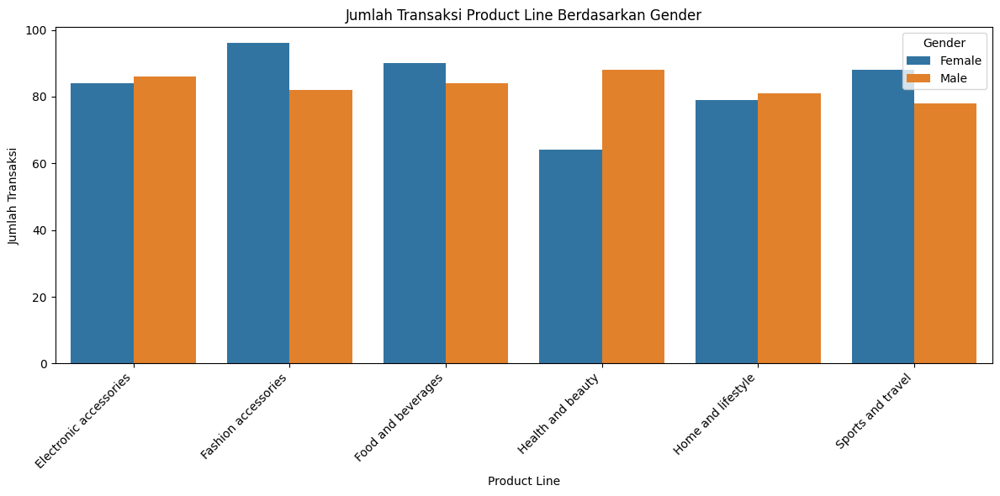

In [16]:
# prompt: analisis product line apa yang paling banyak dibeli oleh gender perempuan dan laki

# Group data by gender and product line, count the number of transactions
gender_product_transactions = df.groupby(['Gender', 'Product line'])['Invoice ID'].count().reset_index()

# Rename the 'Invoice ID' column to 'Transaction Count'
gender_product_transactions = gender_product_transactions.rename(columns={'Invoice ID': 'Transaction Count'})

# Find the product line with the highest number of transactions for each gender
highest_transactions_per_gender = gender_product_transactions.loc[gender_product_transactions.groupby('Gender')['Transaction Count'].idxmax()]

print("\nProduct Line dengan Jumlah Transaksi Tertinggi untuk Setiap Gender:")
print(highest_transactions_per_gender)

# Create a plot showing the product line transaction counts for each gender
plt.figure(figsize=(12, 6))
sns.barplot(x='Product line', y='Transaction Count', hue='Gender', data=gender_product_transactions)
plt.xlabel('Product Line')
plt.ylabel('Jumlah Transaksi')
plt.title('Jumlah Transaksi Product Line Berdasarkan Gender')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


# Conclusion and summary

#### 1. **Branch (Cabang)**
Cabang A memiliki 34% dari total transaksi, sementara dua cabang lainnya mencatatkan persentase transaksi yang hampir sama, yaitu 34,2% dan 32,8%. Meskipun distribusi transaksi antar cabang relatif merata, penting untuk memperhatikan bahwa **Cabang A** menunjukkan potensi terbesar untuk dikembangkan lebih lanjut karena mendekati persentase transaksi tertinggi.

#### **Rekomendasi Kebijakan:**
- **Pengembangan strategi promosi lokal di Cabang A** untuk meningkatkan penjualan lebih lanjut. Ini bisa dilakukan dengan program loyalitas khusus atau diskon eksklusif untuk meningkatkan daya tarik cabang ini.
- **Meningkatkan layanan di cabang yang lain** (Cabang B dan C) dengan menganalisis faktor-faktor lokal yang dapat menarik lebih banyak pelanggan, seperti penyesuaian produk atau pelayanan yang lebih baik.

#### 2. **City (Kota)**
Yangon mencatatkan jumlah transaksi terbanyak (34%), diikuti oleh Mandalay (33,2%) dan Naypyitaw (32,8%). Namun, Naypyitaw menghasilkan pendapatan terbesar dengan gross income tertinggi (5265.1765).

#### **Rekomendasi Kebijakan:**
- **Memprioritaskan strategi peningkatan pendapatan di Naypyitaw**, karena meskipun persentase transaksi lebih rendah, kota ini menghasilkan pendapatan tertinggi. Ini bisa dilakukan dengan memperluas lini produk yang paling menguntungkan di sana, seperti **Food and Beverages** dan **Fashion Accessories**.
- **Untuk Yangon dan Mandalay**, perlu adanya peningkatan penjualan pada kategori produk dengan performa terendah seperti **Health and Beauty** di Yangon dan **Food and Beverages** di Mandalay melalui kampanye promosi yang ditargetkan.

#### 3. **Product Line (Kategori Produk)**
- **Naypyitaw**: Produk **Food and Beverages** dan **Fashion Accessories** memberikan kontribusi tertinggi terhadap pendapatan.
- **Yangon**: Produk **Home and Lifestyle** dan **Sports and Travel** merupakan kontributor utama pendapatan.
- **Mandalay**: Produk **Sports and Travel** dan **Health and Beauty** menunjukkan performa terbaik.

#### **Rekomendasi Kebijakan:**
- **Fokus pada lini produk unggulan per kota.** Di Naypyitaw, fokuslah pada promosi dan stok untuk kategori **Food and Beverages** dan **Fashion Accessories**. Di Yangon, prioritaskan **Home and Lifestyle**, sementara di Mandalay, tingkatkan stok dan promosi untuk **Sports and Travel** serta **Health and Beauty**.
- **Meningkatkan performa lini produk dengan kontribusi terendah** di setiap kota melalui kampanye diskon atau bundling produk, terutama **Home and Lifestyle** di Naypyitaw dan **Health and Beauty** di Yangon.

#### 4. **Month (Bulan)**
Bulan Januari merupakan puncak transaksi dengan 35% dari total transaksi, diikuti oleh bulan Maret (34,5%) dan Februari (30,3%).

#### **Rekomendasi Kebijakan:**
- **Optimalisasi promosi di bulan Januari** dengan meluncurkan kampanye besar untuk menarik lebih banyak pelanggan, mengingat ini merupakan puncak transaksi tahunan.
- **Tingkatkan promosi untuk bulan kedua dan ketiga** melalui penawaran diskon setelah liburan untuk menjaga momentum penjualan.

#### 5. **Tipe Customer**
Transaksi antara **member dan non-member** hampir setara.

#### **Rekomendasi Kebijakan:**
- **Perkuat program loyalitas untuk member** agar mereka lebih sering berbelanja. Tambahkan insentif seperti poin yang bisa ditukarkan dengan diskon atau hadiah.
- **Arahkan promosi untuk mengkonversi pelanggan non-member menjadi member**, sehingga dapat meningkatkan retensi pelanggan.

#### 6. **Gender**
Transaksi antara **male** dan **female** hampir setara.

#### **Rekomendasi Kebijakan:**
- **Sesuaikan promosi berdasarkan gender**, misalnya promosi kesehatan dan kecantikan untuk pelanggan wanita dan promosi elektronik atau olahraga untuk pelanggan pria. Namun, tetap harus fleksibel dengan tren konsumsi.

#### 7. **Payment (Metode Pembayaran)**
Mayoritas pelanggan lebih suka menggunakan **e-wallet** dan **cash** dibandingkan **credit card**.

#### **Rekomendasi Kebijakan:**
- **Promosikan penggunaan e-wallet** dengan memberikan cashback atau diskon tambahan bagi yang menggunakan metode ini.
- **Tingkatkan opsi pembayaran non-tunai**, termasuk meningkatkan kemudahan akses dan penawaran terkait penggunaan e-wallet, karena ini merupakan preferensi utama pelanggan.

### **Kesimpulan Umum dan Strategi untuk Meningkatkan Pendapatan**
- **Optimalisasi kategori produk unggulan per kota** berdasarkan performa penjualan dan kontribusi terhadap pendapatan.
- **Memaksimalkan promosi pada bulan-bulan dengan transaksi terbanyak** dan memperkenalkan kampanye strategis di bulan dengan penjualan rendah.
- **Perkuat hubungan dengan pelanggan melalui program loyalitas** dan kampanye promosi yang ditargetkan, terutama untuk meningkatkan retensi pelanggan dan konversi non-member menjadi member.
- **Promosikan metode pembayaran digital** untuk meningkatkan kenyamanan dan daya tarik bagi pelanggan yang lebih memilih e-wallet.

Dengan menerapkan kebijakan ini, supermarket dapat meningkatkan pendapatan secara signifikan serta mempertahankan loyalitas pelanggan.

In [17]:
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Year
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,5,1,2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,8,3,2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,3,3,2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,27,1,2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,8,2,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46,Ewallet,40.35,4.761905,2.0175,6.2,29,1,2019
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16,Ewallet,973.80,4.761905,48.6900,4.4,2,3,2019
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22,Cash,31.84,4.761905,1.5920,7.7,9,2,2019
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33,Cash,65.82,4.761905,3.2910,4.1,22,2,2019


In [18]:
# Koordinat geografis untuk masing-masing kota
coordinates = {
    'Yangon': {'Latitude': 16.896310501105493, 'Longitude': 96.1760793860054},
    'Naypyitaw': {'Latitude': 19.75313445260758, 'Longitude': 96.08016828732778},
    'Mandalay': {'Latitude': 21.94161318610471, 'Longitude': 96.08817936061853}
}

# Menambahkan kolom Latitude dan Longitude ke DataFrame
df['Latitude'] = df['City'].map(lambda x: coordinates.get(x, {}).get('Latitude'))
df['Longitude'] = df['City'].map(lambda x: coordinates.get(x, {}).get('Longitude'))

In [19]:
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Year,Latitude,Longitude
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,...,Ewallet,522.83,4.761905,26.1415,9.1,5,1,2019,16.896311,96.176079
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,...,Cash,76.40,4.761905,3.8200,9.6,8,3,2019,19.753134,96.080168
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,...,Credit card,324.31,4.761905,16.2155,7.4,3,3,2019,16.896311,96.176079
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,...,Ewallet,465.76,4.761905,23.2880,8.4,27,1,2019,16.896311,96.176079
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,...,Ewallet,604.17,4.761905,30.2085,5.3,8,2,2019,16.896311,96.176079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,...,Ewallet,40.35,4.761905,2.0175,6.2,29,1,2019,19.753134,96.080168
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,...,Ewallet,973.80,4.761905,48.6900,4.4,2,3,2019,21.941613,96.088179
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,...,Cash,31.84,4.761905,1.5920,7.7,9,2,2019,16.896311,96.176079
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,...,Cash,65.82,4.761905,3.2910,4.1,22,2,2019,16.896311,96.176079



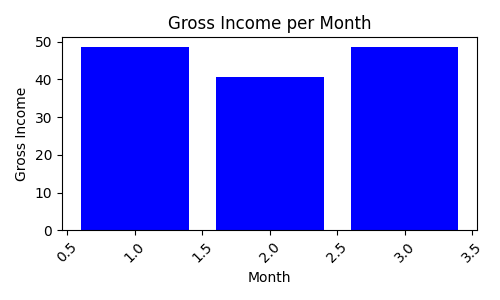
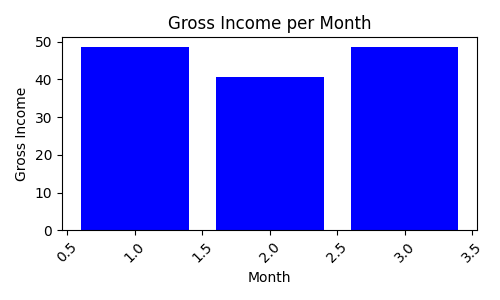
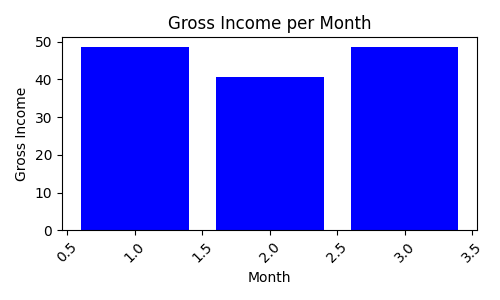
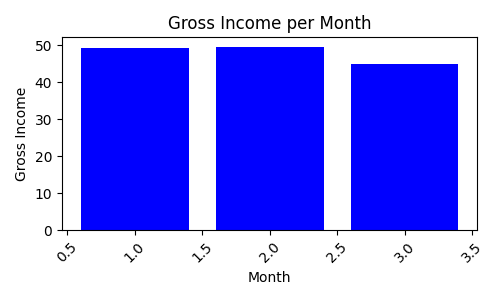
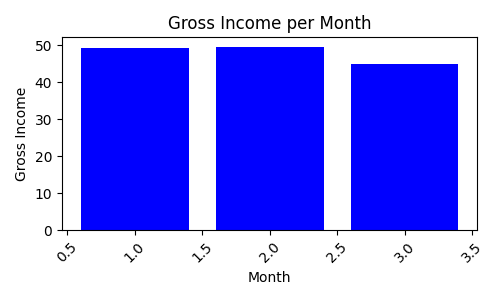
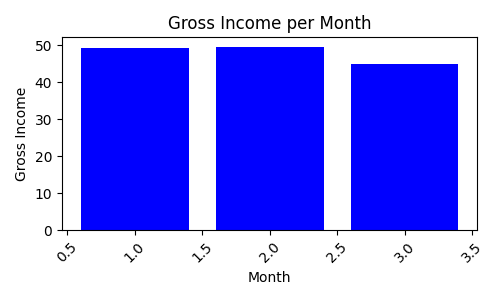
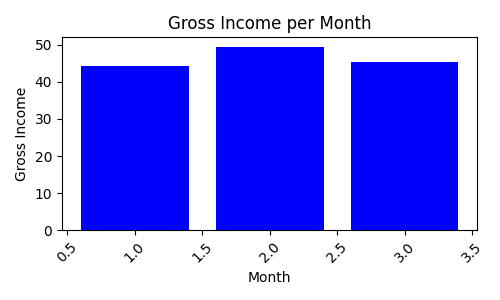
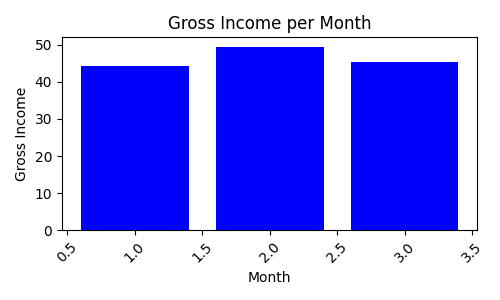
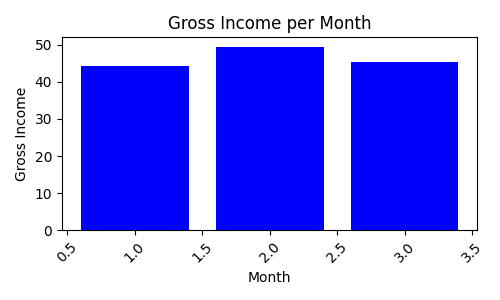

In [30]:
import folium
import matplotlib.pyplot as plt
import pandas as pd
from io import BytesIO
import base64
import geopandas as gpd
import numpy as np


city_month_gross = df.groupby(['City', 'Month', 'Latitude', 'Longitude'])['gross income'].sum().reset_index()


m = folium.Map(location=[20, 96], zoom_start=6)

def plot_bar_chart(data):
    plt.figure(figsize=(5, 3))
    plt.bar(data['Month'], data['gross income'], color='blue')
    plt.xlabel('Month')
    plt.ylabel('Gross Income')
    plt.title('Gross Income per Month')
    plt.xticks(rotation=45)
    plt.tight_layout()


    img_stream = BytesIO()
    plt.savefig(img_stream, format='png')
    plt.close()
    img_stream.seek(0)

    img_base64 = base64.b64encode(img_stream.read()).decode('utf-8')
    return img_base64


shapefile_path = '/content/mmr_polbndL_adm0123_250k_mimu_v01.shp'
gdf = gpd.read_file(shapefile_path)

city_column_name = 'ADM1_L'

gdf = gdf.merge(city_month_gross[['City', 'gross income']], left_on=city_column_name, right_on='City', how='left')

geojson_path = '/content/file.geojson'

gdf.to_file(geojson_path, layer='cities', driver='GeoJSON')

def get_fill_color(income):
    if pd.isna(income):
        return 'lightgrey'
    else:
        scale = plt.cm.get_cmap('Blues')
        normed_income = np.clip(income / city_month_gross['gross income'].max(), 0, 1)
        color = scale(normed_income)[:3]
        return folium.colors.rgb_to_hex(color)

folium.GeoJson(
    geojson_path,
    style_function=lambda feature: {
        'fillColor': get_fill_color(feature['properties'].get('gross income', np.nan)),
        'color': 'red',
        'weight': 2,
        'fillOpacity': 0.5,
    }
).add_to(m)


for index, row in city_month_gross.iterrows():
    city = row['City']
    month = row['Month']
    gross_income = row['gross income']
    latitude = row['Latitude']
    longitude = row['Longitude']

    chart_data = df[(df['City'] == city) & (df['Latitude'] == latitude) & (df['Longitude'] == longitude)]

    img_base64 = plot_bar_chart(chart_data)

    popup_text = f"City: {city}<br>Month: {month}<br>Gross Income: {gross_income:.2f}"

    folium.Marker(
        location=[latitude, longitude],
        popup=folium.Popup(folium.Html(f"<img src='data:image/png;base64,{img_base64}' width='300' height='150'/>", script=True), max_width=300),
        icon=folium.Icon(color='blue')
    ).add_to(m)

m
